In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch
from scipy import signal
from scipy.signal import hilbert


sys.path.insert(0, r"/Users/novak/Documents/UTSW/erfan/deeplagfield/StocasticDiffEq_Simulation")

from NeuralFieldManifold.models import AR
from NeuralFieldManifold.embedders import embed
from NeuralFieldManifold.pub_utils import set_pub_style, prettify
set_pub_style()

In [2]:
signal_path = r"/Users/novak/Documents/UTSW/erfan/deeplagfield/eeg_signal_sec3.npy"
time_path   = r"/Users/novak/Documents/UTSW/erfan/deeplagfield/eeg_time_sec3.npy"
label_path  = r"/Users/novak/Documents/UTSW/erfan/deeplagfield/state_sec3.npy"

eeg = np.load(signal_path)
time = np.load(time_path)
labels = np.load(label_path)

fs = 400

print(f"EEG shape: {eeg.shape}, fs: {fs:.1f} Hz")
print(f"Time shape: {time.shape}")
print(f"Labels shape: {labels.shape}")
print(f"Unique labels: {np.unique(labels)}")
print(f"Duration: {len(eeg)/fs:.1f} sec")

EEG shape: (1440000,), fs: 400.0 Hz
Time shape: (1440000,)
Labels shape: (1800,)
Unique labels: [0 1 2]
Duration: 3600.0 sec


In [3]:
def load_eeg_data(time_path, signal_path):
    """Load EEG data from numpy files."""
    time = np.load(time_path)
    signal_data = np.load(signal_path)
    fs = 1 / np.mean(np.diff(time))
    return time, signal_data, fs

def bandpass_filter(x, Fs, low, high, order=4):
    wn = [low/(Fs/2), high/(Fs/2)]
    sos = signal.butter(order, wn, btype='bandpass', output='sos')
    return signal.sosfiltfilt(sos, x)

def envelope_normalize(x, fs, fband=(15, 30), env_lp_hz=5.0, eps=1e-6):
    b, a = signal.butter(4, np.array(fband)/(fs/2), btype='bandpass')
    x_bp = signal.filtfilt(b, a, x)
    z = hilbert(x_bp)
    A = np.abs(z)
    if env_lp_hz is not None:
        b_lp, a_lp = signal.butter(2, env_lp_hz/(fs/2), btype='low')
        A = signal.filtfilt(b_lp, a_lp, A)
    x_flat = x_bp / (A + eps)
    x_flat *= np.median(A)
    return x_flat, x_bp, A

def process_eeg_signal(raw_signal, Fs, 
                       notch_freq=60, notch_Q=30,
                       bandpass_low=0.5, bandpass_high=40,
                       fband=(1, 40), env_lp_hz=3.0):
    """Process EEG signal with notch filter, bandpass, and envelope normalization."""
    filtered = signal.filtfilt(*signal.iirnotch(notch_freq, notch_Q, Fs), raw_signal)
    x = np.asarray(filtered).ravel()
    xs_raw = bandpass_filter(x, Fs, low=bandpass_low, high=bandpass_high)
    xs, _, _ = envelope_normalize(xs_raw, Fs, fband=fband, env_lp_hz=env_lp_hz)
    return xs, xs_raw

In [4]:
preprocessed, xs_raw = process_eeg_signal(eeg, fs)

win_samples = int(2 * fs)
n_windows = len(labels)

eeg_windows = preprocessed.reshape(n_windows, win_samples)

# Band power features (baseline decoder)
bands = {
    'delta': (0.5, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta':  (13, 30),
}

band_power = np.zeros((n_windows, len(bands)))

for i in range(n_windows):
    freqs, psd = welch(eeg_windows[i], fs=fs, nperseg=min(512, win_samples), noverlap=256)
    for j, (band_name, (flo, fhi)) in enumerate(bands.items()):
        idx = (freqs >= flo) & (freqs <= fhi)
        band_power[i, j] = np.trapezoid(psd[idx], freqs[idx])
band_power_log = np.log10(band_power + 1e-12)


In [5]:
# tau = 7
# dim = 3

# embed_features = np.zeros((n_windows, dim))

# for i in range(n_windows):
#     X3 = embed(eeg_windows[i], dim, tau)
#     embed_features[i] = X3.mean(axis=0)


tau = 1
dim = 3

feature_list = []

for i in range(n_windows):
    X3 = embed(eeg_windows[i], dim, tau)
    
    mu = X3.mean(axis=0)          # 3 features
    sd = X3.std(axis=0)           # 3 features  
    
    cov = np.cov(X3.T)
    triu_idx = np.triu_indices(dim)
    cov_feat = cov[triu_idx]      # 6 features
    
    feature_list.append(np.concatenate([mu, sd, cov_feat]))

embed_features_rich = np.array(feature_list)


In [6]:
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# from sklearn.model_selection import StratifiedKFold, cross_val_predict
# from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# lda = LinearDiscriminantAnalysis(priors=[1/3, 1/3, 1/3])
# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# # Baseline: band power
# pred_band = cross_val_predict(lda, band_power_log, labels, cv=cv)
# acc_band = accuracy_score(labels, pred_band)

# # Rerun LDA
# pred_embed2 = cross_val_predict(lda, embed_features_rich, labels, cv=cv)
# acc_embed2 = accuracy_score(labels, pred_embed2)



# print(f"=== Band Power (baseline) ===")
# print(f"Accuracy: {acc_band:.3f}")
# print(classification_report(labels, pred_band, target_names=['0','1','2']))

# print(f"\n=== Lag Embedding ===")
# print(f"Accuracy: {acc_embed2:.3f}")
# print(classification_report(labels, pred_embed2, target_names=['0','1','2']))

In [7]:
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# state_names = ['Wake', 'NREM', 'REM']

# # --- Panel A: Confusion matrices side by side ---
# fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# cm_band = confusion_matrix(labels, pred_band, normalize='true')
# ConfusionMatrixDisplay(cm_band, display_labels=state_names).plot(ax=axes[0], cmap='Blues', values_format='.2f', colorbar=False)
# axes[0].set_title('Band power (baseline)')

# cm_embed = confusion_matrix(labels, pred_embed2, normalize='true')
# ConfusionMatrixDisplay(cm_embed, display_labels=state_names).plot(ax=axes[1], cmap='Blues', values_format='.2f', colorbar=False)
# axes[1].set_title('Lag embedding')

# plt.tight_layout()
# plt.show()

# # --- Panel B: LDA projection colored by sleep stage ---
# lda_proj = LinearDiscriminantAnalysis()
# X_lda = lda_proj.fit_transform(embed_features_rich, labels)

# colors = {0: '#D85A30', 1: '#3266ad', 2: '#1D9E75'}
# fig, ax = plt.subplots(figsize=(6, 5))

# for label, name in enumerate(state_names):
#     mask = labels == label
#     ax.scatter(X_lda[mask, 0], X_lda[mask, 1], 
#                c=colors[label], label=name, s=8, alpha=0.5)

# ax.set_xlabel('LD1')
# ax.set_ylabel('LD2')
# ax.set_title('LDA discriminant projection (lag embedding features)')
# ax.legend(markerscale=3)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# plt.tight_layout()
# plt.show()

In [8]:
from sklearn.utils import resample
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Undersample to balance classes
np.random.seed(42)
min_count = min(np.sum(labels == 0), np.sum(labels == 1), np.sum(labels == 2))
print(f"Balancing to {min_count} samples per class")

idx_balanced = []
for state in [0, 1, 2]:
    state_idx = np.where(labels == state)[0]
    chosen = resample(state_idx, n_samples=min_count, replace=False, random_state=42)
    idx_balanced.extend(chosen)

idx_balanced = np.array(idx_balanced)
np.random.shuffle(idx_balanced)

labels_bal = labels[idx_balanced]
band_bal = band_power_log[idx_balanced]
embed_bal = embed_features_rich[idx_balanced]

print(f"Balanced dataset: {len(labels_bal)} samples")
for v in [0, 1, 2]:
    print(f"  Class {v}: {np.sum(labels_bal == v)}")

# Rerun LDA on balanced data
lda = LinearDiscriminantAnalysis()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

pred_band_bal = cross_val_predict(lda, band_bal, labels_bal, cv=cv)
pred_embed_bal = cross_val_predict(lda, embed_bal, labels_bal, cv=cv)

acc_band_bal = accuracy_score(labels_bal, pred_band_bal)
acc_embed_bal = accuracy_score(labels_bal, pred_embed_bal)

print(f"\nBand power:    acc={acc_band_bal:.3f}")
print(f"Lag embedding: acc={acc_embed_bal:.3f}")
print(f"\nBand power report:")
print(classification_report(labels_bal, pred_band_bal, target_names=['Wake','NREM','REM']))
print(f"Lag embedding report:")
print(classification_report(labels_bal, pred_embed_bal, target_names=['Wake','NREM','REM']))

Balancing to 109 samples per class
Balanced dataset: 327 samples
  Class 0: 109
  Class 1: 109
  Class 2: 109

Band power:    acc=0.599
Lag embedding: acc=0.716

Band power report:
              precision    recall  f1-score   support

        Wake       0.61      0.58      0.59       109
        NREM       0.70      0.77      0.73       109
         REM       0.48      0.45      0.46       109

    accuracy                           0.60       327
   macro avg       0.59      0.60      0.60       327
weighted avg       0.59      0.60      0.60       327

Lag embedding report:
              precision    recall  f1-score   support

        Wake       0.65      0.64      0.65       109
        NREM       0.84      0.94      0.88       109
         REM       0.63      0.57      0.60       109

    accuracy                           0.72       327
   macro avg       0.71      0.72      0.71       327
weighted avg       0.71      0.72      0.71       327



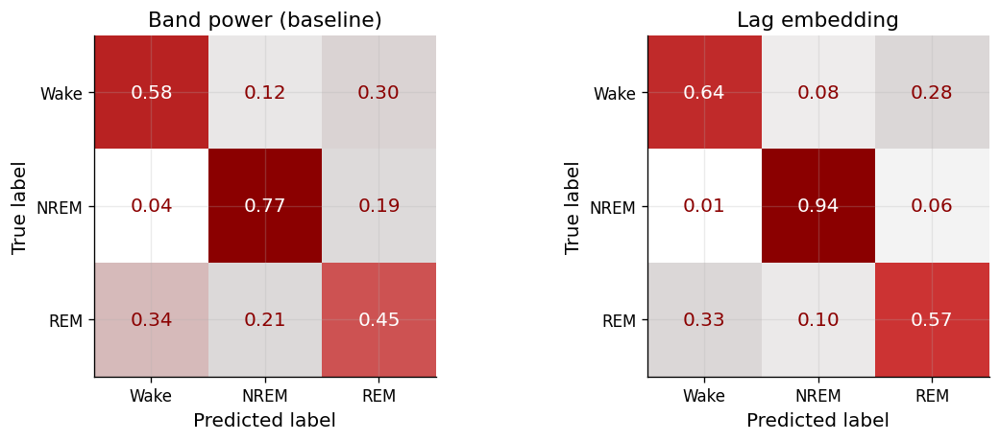

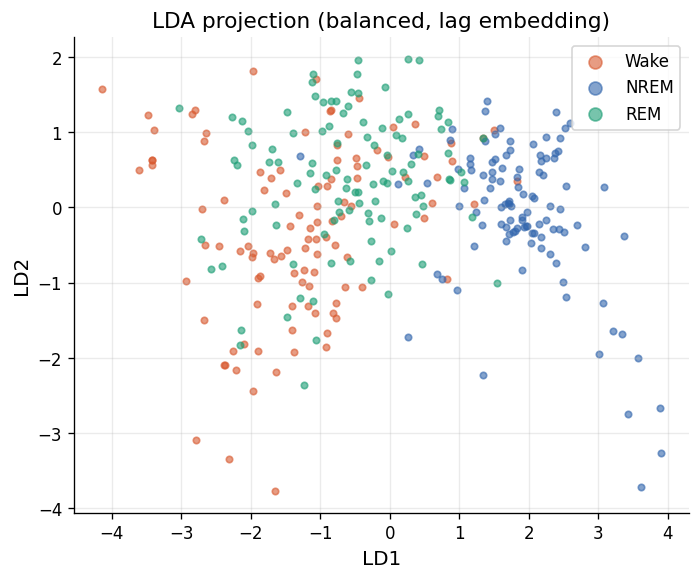

In [9]:
from sklearn.metrics import ConfusionMatrixDisplay
from matplotlib import colors as mcolors

state_names = ['Wake', 'NREM', 'REM']
colors = {0: '#D85A30', 1: '#3266ad', 2: '#1D9E75'}

cmap = mcolors.LinearSegmentedColormap.from_list(
    "white_majority_darkred",
    [
        (0.0, "#ffffff"),
        (0.35, "#aca3a36c"),
        (0.60, "#c10404cf"),
        (1.0, "#8b0000ff")
    ]
)

# Confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

cm_band = confusion_matrix(labels_bal, pred_band_bal, normalize='true')
ConfusionMatrixDisplay(cm_band, display_labels=state_names).plot(ax=axes[0], cmap=cmap, values_format='.2f', colorbar=False)
axes[0].set_title('Band power (baseline)')

cm_embed = confusion_matrix(labels_bal, pred_embed_bal, normalize='true')
ConfusionMatrixDisplay(cm_embed, display_labels=state_names).plot(ax=axes[1], cmap=cmap, values_format='.2f', colorbar=False)
axes[1].set_title('Lag embedding')

plt.tight_layout()
plt.show()

# LDA projection on balanced data
lda_proj = LinearDiscriminantAnalysis()
X_lda = lda_proj.fit_transform(embed_bal, labels_bal)

fig, ax = plt.subplots(figsize=(6, 5))
for label, name in enumerate(state_names):
    mask = labels_bal == label
    ax.scatter(X_lda[mask, 0], X_lda[mask, 1],
               c=colors[label], label=name, s=15, alpha=0.6)

ax.set_xlabel('LD1')
ax.set_ylabel('LD2')
ax.set_title('LDA projection (balanced, lag embedding)')
ax.legend(markerscale=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

Done.


/var/folders/w2/4bn86c516gl31kymqxtwhnmw0000gn/T/ipykernel_48459/62856704.py:110: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=2.5)


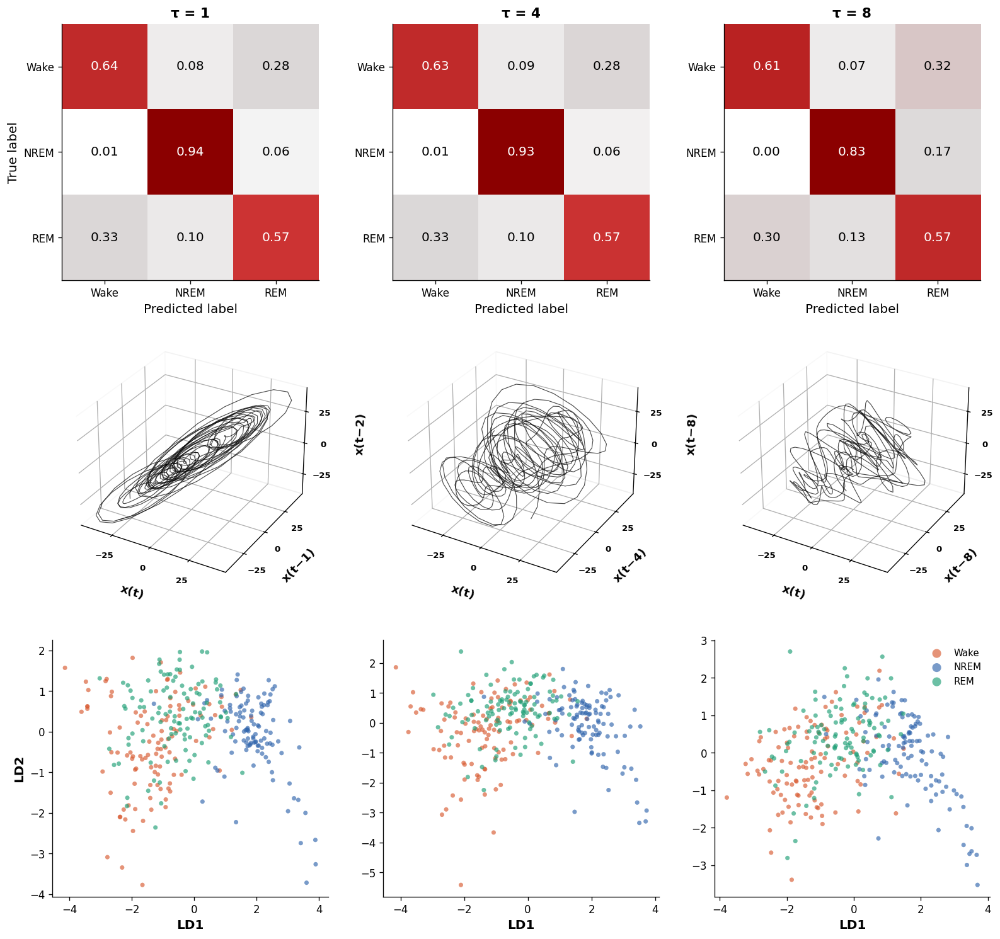

In [30]:

from sklearn.metrics import ConfusionMatrixDisplay
from matplotlib import colors as mcolors
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.mplot3d import Axes3D

taus = [1, 4, 8]
state_names = ['Wake', 'NREM', 'REM']

# Confusion matrix colormap
cmap_cm = mcolors.LinearSegmentedColormap.from_list(
    "white_majority_darkred",
    [
        (0.0, "#ffffff"),
        (0.35, "#aca3a36c"),
        (0.60, "#c10404cf"),
        (1.0, "#8b0000ff")
    ]
)

# LDA scatter colors
lda_clrs = {0: '#D85A30', 1: '#3266ad', 2: '#1D9E75'}

# --- precompute per-tau ---
results = {}
for t in taus:
    feat_list = []
    for i in range(n_windows):
        X3 = embed(eeg_windows[i], dim, t)
        mu = X3.mean(axis=0)
        sd = X3.std(axis=0)
        cov = np.cov(X3.T)
        cov_feat = cov[np.triu_indices(dim)]
        feat_list.append(np.concatenate([mu, sd, cov_feat]))
    feat = np.array(feat_list)
    feat_bal = feat[idx_balanced]

    lda_cv = LinearDiscriminantAnalysis()
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    pred = cross_val_predict(lda_cv, feat_bal, labels_bal, cv=cv)
    cm = confusion_matrix(labels_bal, pred, normalize='true')

    lda_proj = LinearDiscriminantAnalysis()
    X_lda = lda_proj.fit_transform(feat_bal, labels_bal)

    results[t] = dict(cm=cm, X_lda=X_lda)

print("Done.")

# --- 3 x 3 figure ---
fig = plt.figure(figsize=(16, 15))

for col, t in enumerate(taus):
    r = results[t]

    # ── Row 1: Confusion matrix ──
    ax_cm = fig.add_subplot(3, 3, col + 1)
    disp = ConfusionMatrixDisplay(r['cm'], display_labels=state_names)
    disp.plot(ax=ax_cm, cmap=cmap_cm, values_format='.2f', colorbar=False)
    for txt in disp.text_.ravel():
        r_, g_, b_, _ = mcolors.to_rgba(txt.get_color())
        if not (r_ > 0.95 and g_ > 0.95 and b_ > 0.95):
            txt.set_color('black')
    ax_cm.set_title(f'τ = {t}', fontsize=13, fontweight='bold')
    ax_cm.grid(False)
    if col > 0:
        ax_cm.set_ylabel('')

    # ── Row 2: 3D lag embedding (downsampled) ──
    ax_3d = fig.add_subplot(3, 3, col + 4, projection='3d')
    for state_id in [0, 1, 2]:
        idxs = np.where(labels == state_id)[0]
        wi = idxs[len(idxs)//2]
        X3 = embed(eeg_windows[wi], dim, t)
        X3 = X3[:200]
        ax_3d.plot(X3[:, 0], X3[:, 1], X3[:, 2],
                   lw=0.7, alpha=0.7, color='black')

    ax_3d.set_xlabel(r"$\mathbf{x(t)}$", labelpad=8, fontsize=11)
    ax_3d.set_ylabel(f"$\\mathbf{{x(t\\!-\\!{t})}}$", labelpad=8, fontsize=11)
    ax_3d.set_zlabel(f"$\\mathbf{{x(t\\!-\\!{2*t})}}$", labelpad=12, fontsize=11)

    ax_3d.xaxis.set_major_locator(MaxNLocator(nbins=4))
    ax_3d.yaxis.set_major_locator(MaxNLocator(nbins=4))
    ax_3d.zaxis.set_major_locator(MaxNLocator(nbins=4))
    ax_3d.tick_params(axis='both', pad=3, labelsize=8)

    for lbl in ax_3d.xaxis.get_ticklabels() + ax_3d.yaxis.get_ticklabels() + ax_3d.zaxis.get_ticklabels():
        lbl.set_fontweight('bold')

    ax_3d.xaxis.pane.fill = False
    ax_3d.yaxis.pane.fill = False
    ax_3d.zaxis.pane.fill = False

    # ── Row 3: LDA projection ──
    ax_lda = fig.add_subplot(3, 3, col + 7)
    for state_id, sname in enumerate(state_names):
        mask = labels_bal == state_id
        ax_lda.scatter(r['X_lda'][mask, 0], r['X_lda'][mask, 1],
                       c=lda_clrs[state_id], label=sname, s=18, alpha=0.65,
                       edgecolors='none')
    ax_lda.set_xlabel('LD1', fontweight='bold')
    ax_lda.grid(False)
    if col == 0:
        ax_lda.set_ylabel('LD2', fontweight='bold')
    if col == 2:
        ax_lda.legend(markerscale=2, fontsize=9, frameon=False)
    ax_lda.spines['top'].set_visible(False)
    ax_lda.spines['right'].set_visible(False)

plt.tight_layout(pad=2.5)
plt.show()


48 3 477


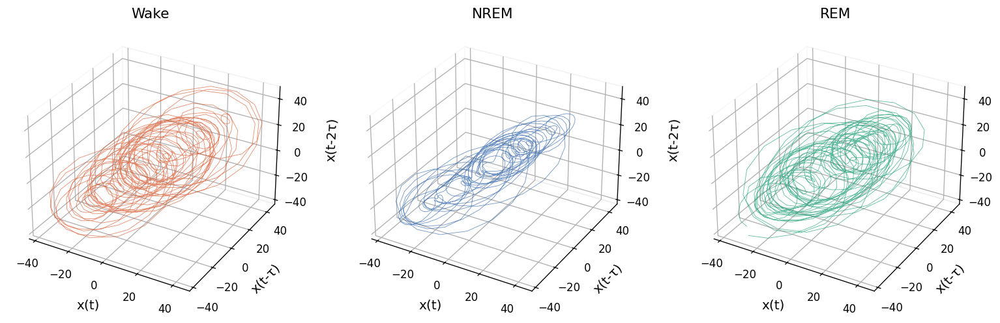

In [31]:
# Pick one example window from each state
idx_wake = np.where(labels == 0)[0][4]
idx_nrem = np.where(labels == 1)[0][3]
idx_rem  = np.where(labels == 2)[0][3]
print(idx_wake, idx_nrem, idx_rem)
# Pre-compute embeddings to find shared axis limits
embeddings = {}
for idx, name in [(idx_wake, 'Wake'), (idx_nrem, 'NREM'), (idx_rem, 'REM')]:
    embeddings[name] = embed(eeg_windows[idx], dim, tau)

all_pts = np.vstack(list(embeddings.values()))
vmin, vmax = all_pts.min(), all_pts.max()
pad = (vmax - vmin) * 0.05
vmin -= pad
vmax += pad

fig = plt.figure(figsize=(16, 5))

for i, (name, color) in enumerate([
    ('Wake', '#D85A30'),
    ('NREM', '#3266ad'),
    ('REM',  '#1D9E75')
]):
    X3 = embeddings[name]
    ax = fig.add_subplot(1, 3, i+1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2], lw=0.5, alpha=0.7, color=color)
    ax.set_title(name)
    ax.set_xlabel('x(t)', labelpad=6)
    ax.set_ylabel('x(t-τ)', labelpad=6)
    ax.set_zlabel('x(t-2τ)', labelpad=10)
    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)
    ax.set_zlim(vmin, vmax)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

# plt.subplots_adjust(left=0.02, right=0.98, wspace=0.15)
plt.show()


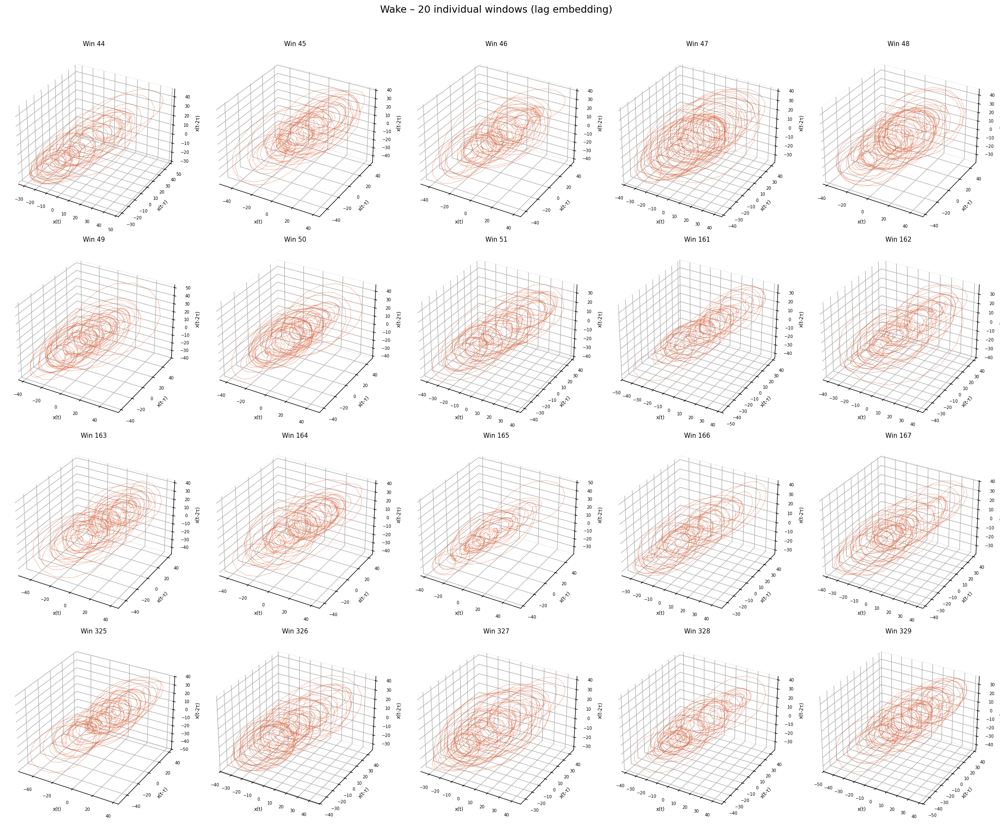

In [13]:
# 20 Wake windows – individual 3D subplots
wake_idxs = np.where(labels == 0)[0][:20]
dim = 3
tau = 2
fig = plt.figure(figsize=(20, 16))

for i, wi in enumerate(wake_idxs):
    X3 = embed(eeg_windows[wi], dim, tau)
    ax = fig.add_subplot(4, 5, i + 1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2],
            lw=0.4, alpha=0.7, color='#D85A30')
    ax.set_title(f'Win {wi}', fontsize=9)
    ax.set_xlabel('x(t)', fontsize=7, labelpad=1)
    ax.set_ylabel('x(t-τ)', fontsize=7, labelpad=1)
    ax.set_zlabel('x(t-2τ)', fontsize=7, labelpad=1)
    ax.tick_params(labelsize=6)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

plt.suptitle('Wake – 20 individual windows (lag embedding)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


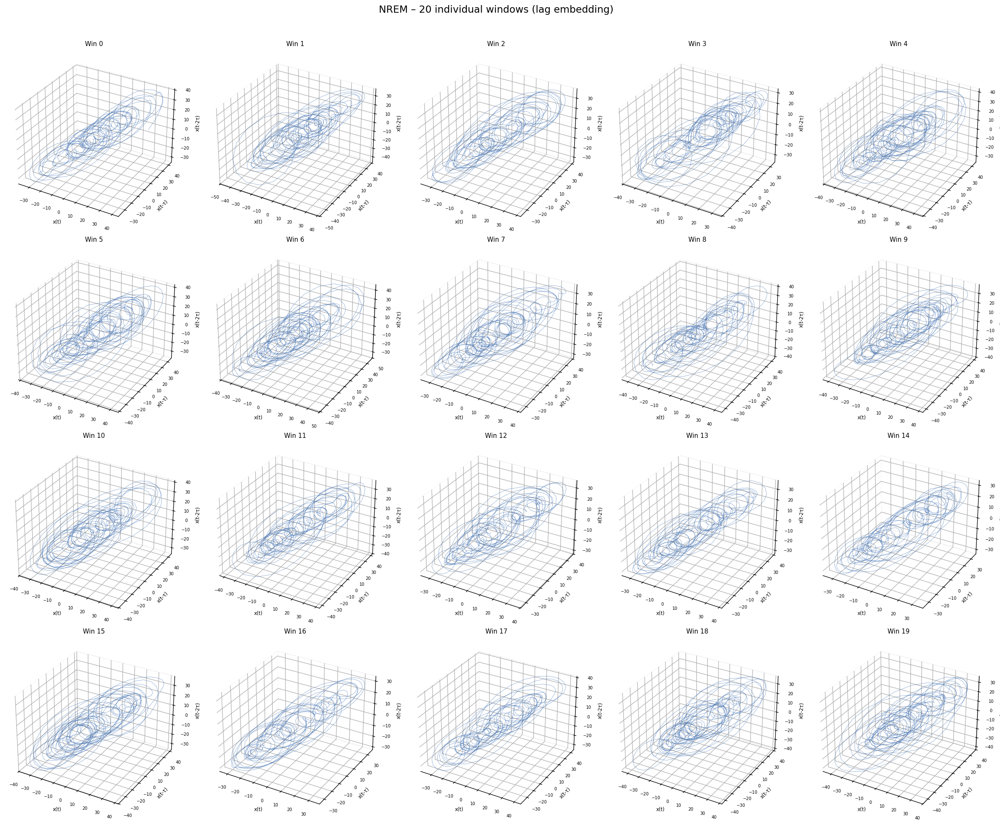

In [14]:
# 20 NREM windows – individual 3D subplots
nrem_idxs = np.where(labels == 1)[0][:20]
dim = 3
tau = 2
fig = plt.figure(figsize=(20, 16))

for i, wi in enumerate(nrem_idxs):
    X3 = embed(eeg_windows[wi], dim, tau)
    ax = fig.add_subplot(4, 5, i + 1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2],
            lw=0.4, alpha=0.7, color='#3266ad')
    ax.set_title(f'Win {wi}', fontsize=9)
    ax.set_xlabel('x(t)', fontsize=7, labelpad=1)
    ax.set_ylabel('x(t-τ)', fontsize=7, labelpad=1)
    ax.set_zlabel('x(t-2τ)', fontsize=7, labelpad=1)
    ax.tick_params(labelsize=6)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

plt.suptitle('NREM – 20 individual windows (lag embedding)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


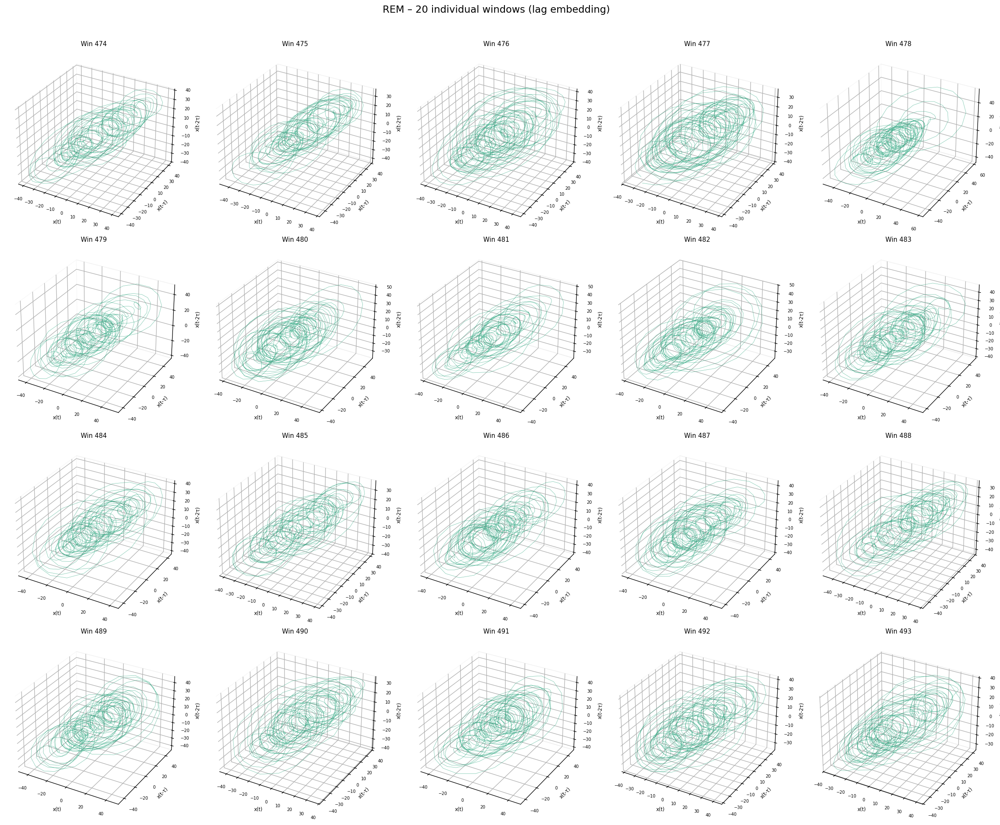

In [16]:
# 20 REM windows – individual 3D subplots
rem_idxs = np.where(labels == 2)[0][:20]
dim = 3
tau = 2
fig = plt.figure(figsize=(20, 16))

for i, wi in enumerate(rem_idxs):
    X3 = embed(eeg_windows[wi], dim, tau)
    ax = fig.add_subplot(4, 5, i + 1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2],
            lw=0.4, alpha=0.7, color='#1D9E75')
    ax.set_title(f'Win {wi}', fontsize=9)
    ax.set_xlabel('x(t)', fontsize=7, labelpad=1)
    ax.set_ylabel('x(t-τ)', fontsize=7, labelpad=1)
    ax.set_zlabel('x(t-2τ)', fontsize=7, labelpad=1)
    ax.tick_params(labelsize=6)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

plt.suptitle('REM – 20 individual windows (lag embedding)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


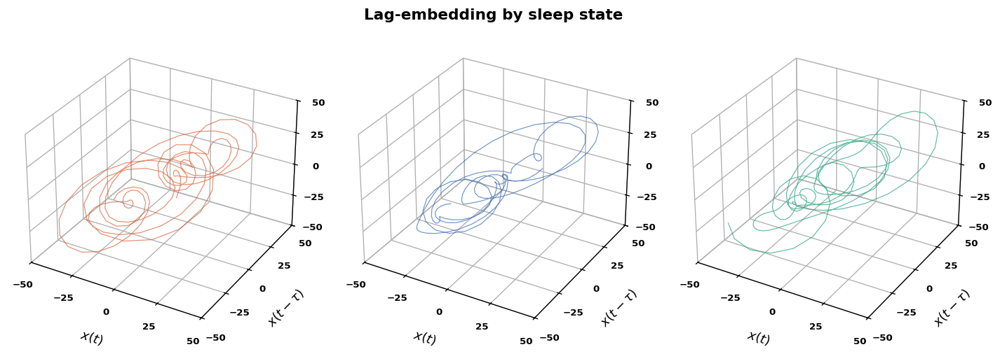

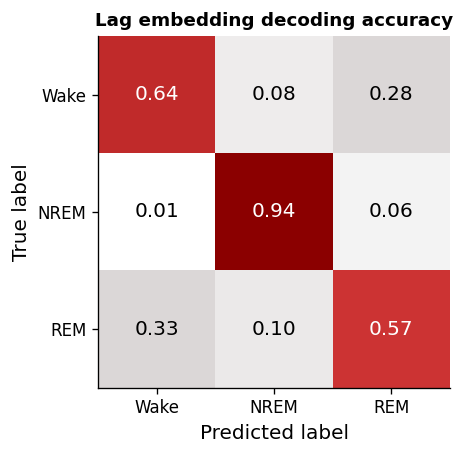

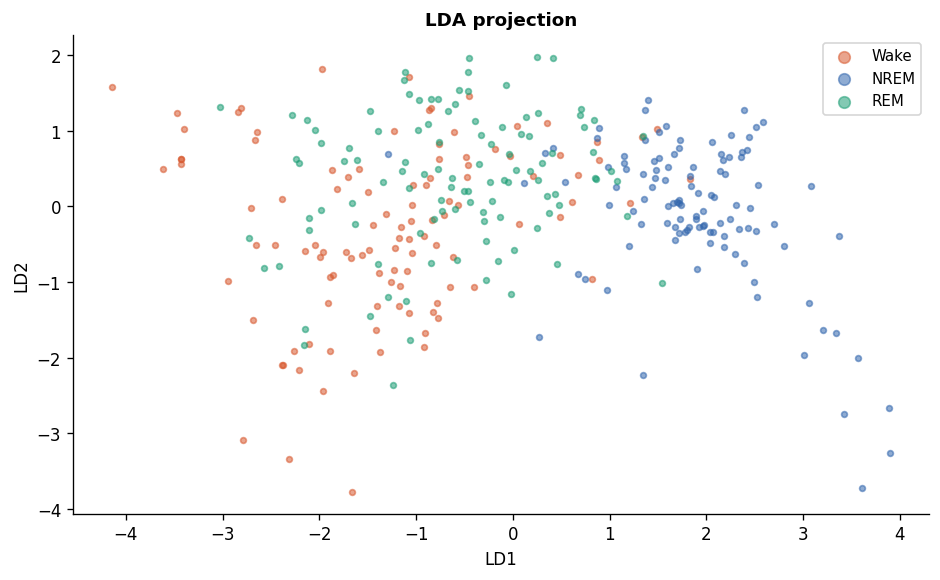

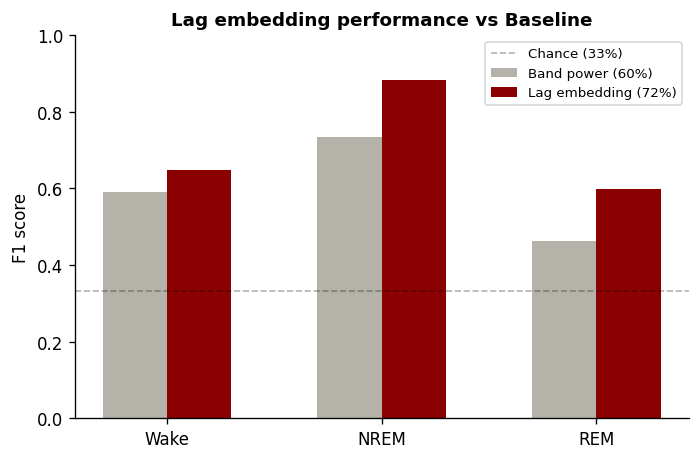

In [77]:
from matplotlib.ticker import MaxNLocator

state_names = ['Wake', 'NREM', 'REM']
colors_list = ['#D85A30', '#3266ad', '#1D9E75']

cmap_cm = mcolors.LinearSegmentedColormap.from_list(
    "white_majority_darkred",
    [
        (0.0, "#ffffff"),
        (0.35, "#aca3a36c"),
        (0.60, "#c10404cf"),
        (1.0, "#8b0000ff")
    ]
)

# ── Panel a: 3D lag-embedding trajectories ──
fig = plt.figure(figsize=(12, 8))
fig.suptitle('Lag-embedding by sleep state', fontsize=13, fontweight='bold', y=0.92)
axis_range = (-50, 50)
for i, (state, name, color) in enumerate(zip([0,1,2], state_names, colors_list)):
    ax = fig.add_subplot(1, 3, i+1, projection='3d')
    idx = np.where(labels == state)[0][10]
    X3 = embed(eeg_windows[idx][:200], dim, tau)
    ax.plot(X3[:,0], X3[:,1], X3[:,2], lw=0.7, alpha=0.7, color=color)
    # ax.set_title(name, fontsize=11, color="black", fontweight='bold')
    ax.set_xlabel(r'$x(t)$', labelpad=8, fontsize=11)
    ax.set_ylabel(f'$x(t-\\tau)$', labelpad=8, fontsize=11)
    ax.set_zlabel(f"$x(t-2\\tau)$", labelpad=12, fontsize=11)
    ax.set_xlim(axis_range)
    ax.set_ylim(axis_range)
    ax.set_zlim(axis_range)
    ax.xaxis.set_major_locator(MaxNLocator(nbins=4))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=4))
    ax.zaxis.set_major_locator(MaxNLocator(nbins=4))
    ax.tick_params(axis='both', pad=3, labelsize=8)
    for lbl in ax.xaxis.get_ticklabels() + ax.yaxis.get_ticklabels() + ax.zaxis.get_ticklabels():
        lbl.set_fontweight('bold')
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
fig.subplots_adjust(left=0.02, right=0.98, top=1.2, wspace=0.1)
# plt.savefig('panel_a_trajectories.pdf', bbox_inches='tight', dpi=300)
plt.show()

# ── Panel b: Confusion matrix ──
fig, ax_cm = plt.subplots(figsize=(4, 4))
cm = confusion_matrix(labels_bal, pred_embed_bal, normalize='true')
disp = ConfusionMatrixDisplay(cm, display_labels=state_names)
disp.plot(ax=ax_cm, cmap=cmap_cm, values_format='.2f', colorbar=False)
for txt in disp.text_.ravel():
    r_, g_, b_, _ = mcolors.to_rgba(txt.get_color())
    if not (r_ > 0.95 and g_ > 0.95 and b_ > 0.95):
        txt.set_color('black')
ax_cm.grid(False)
ax_cm.set_title('Lag embedding decoding accuracy', fontsize=11, fontweight='bold')
plt.tight_layout()
# plt.savefig('panel_b_confusion.pdf', bbox_inches='tight', dpi=300)
plt.show()

# ── Panel c: LDA projection ──
fig, ax_lda = plt.subplots(figsize=(8, 5))
lda_proj = LinearDiscriminantAnalysis()
X_lda = lda_proj.fit_transform(embed_bal, labels_bal)
for label, name, color in zip([0,1,2], state_names, colors_list):
    mask = labels_bal == label
    ax_lda.scatter(X_lda[mask,0], X_lda[mask,1], c=color, label=name, s=12, alpha=0.55)
ax_lda.set_xlabel('LD1', fontsize=10)
ax_lda.set_ylabel('LD2', fontsize=10)
ax_lda.legend(fontsize=9, markerscale=2)
ax_lda.spines['top'].set_visible(False)
ax_lda.spines['right'].set_visible(False)
ax_lda.set_title('LDA projection', fontsize=11, fontweight='bold')
ax_lda.grid(False)
plt.tight_layout()
# plt.savefig('panel_c_lda.pdf', bbox_inches='tight', dpi=300)
plt.show()

# ── Panel d: F1 bar chart ──
fig, ax_bar = plt.subplots(figsize=(6, 4))
from sklearn.metrics import f1_score
f1_band = f1_score(labels_bal, pred_band_bal, average=None)
f1_embed = f1_score(labels_bal, pred_embed_bal, average=None)

x = np.arange(3)
w = 0.3
bars1 = ax_bar.bar(x - w/2, f1_band, w, label=f'Band power ({acc_band_bal:.0%})', color='#B4B2A9')
bars2 = ax_bar.bar(x + w/2, f1_embed, w, label=f'Lag embedding ({acc_embed_bal:.0%})', color='#8b0000ff')
ax_bar.axhline(1/3, ls='--', color='black', alpha=0.3, lw=1, label='Chance (33%)')
ax_bar.set_xticks(x)
ax_bar.set_xticklabels(state_names, fontsize=10)
ax_bar.set_ylabel('F1 score', fontsize=10)
ax_bar.set_ylim(0, 1)
ax_bar.legend(fontsize=8, loc='upper right')
ax_bar.spines['top'].set_visible(False)
ax_bar.spines['right'].set_visible(False)
ax_bar.set_title('Lag embedding performance vs Baseline', fontsize=11, fontweight='bold')
ax_bar.grid(False)
plt.tight_layout()
# plt.savefig('panel_d_f1.pdf', bbox_inches='tight', dpi=300)
plt.show()

/var/folders/w2/4bn86c516gl31kymqxtwhnmw0000gn/T/ipykernel_48459/748541906.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


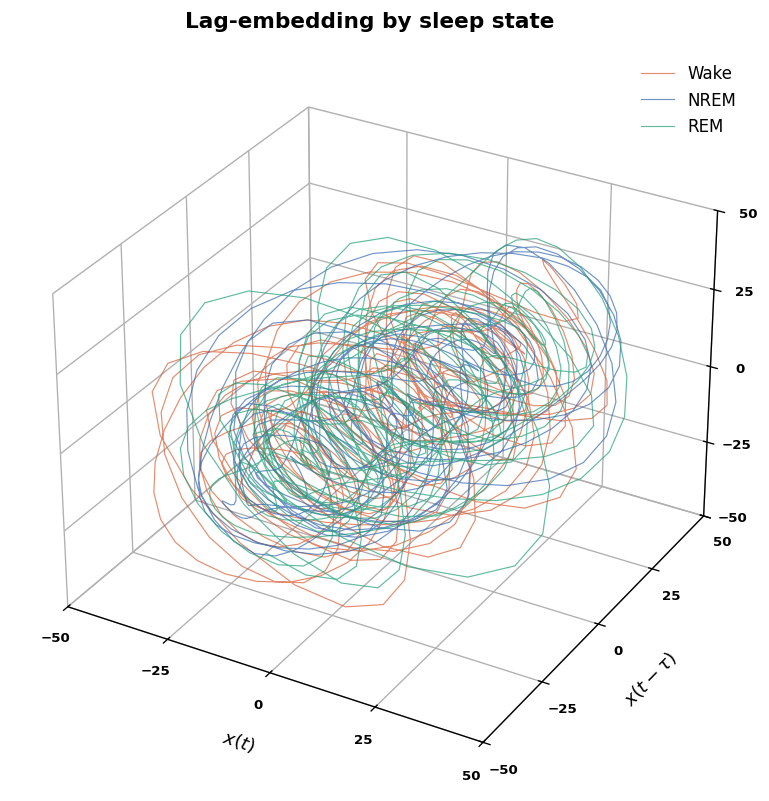

In [85]:
tau = 4

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
axis_range = (-50, 50)
for state, name, color in zip([0,1,2], state_names, colors_list):
    idx = np.where(labels == state)[0][10]
    X3 = embed(eeg_windows[idx][:800], dim, tau)
    ax.plot(X3[:,0], X3[:,1], X3[:,2], lw=0.7, alpha=0.7, color=color, label=name)

ax.set_xlabel(r'$x(t)$', labelpad=8, fontsize=11)
ax.set_ylabel(f'$x(t-\\tau)$', labelpad=8, fontsize=11)
ax.set_zlabel(f"$x(t-2\\tau)$", labelpad=12, fontsize=11)
ax.set_xlim(axis_range)
ax.set_ylim(axis_range)
ax.set_zlim(axis_range)
ax.xaxis.set_major_locator(MaxNLocator(nbins=4))
ax.yaxis.set_major_locator(MaxNLocator(nbins=4))
ax.zaxis.set_major_locator(MaxNLocator(nbins=4))
ax.tick_params(axis='both', pad=3, labelsize=8)
for lbl in ax.xaxis.get_ticklabels() + ax.yaxis.get_ticklabels() + ax.zaxis.get_ticklabels():
    lbl.set_fontweight('bold')
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.legend(fontsize=10, frameon=False)
fig.suptitle('Lag-embedding by sleep state', fontsize=13, fontweight='bold', y=0.92)
plt.tight_layout()
plt.show()

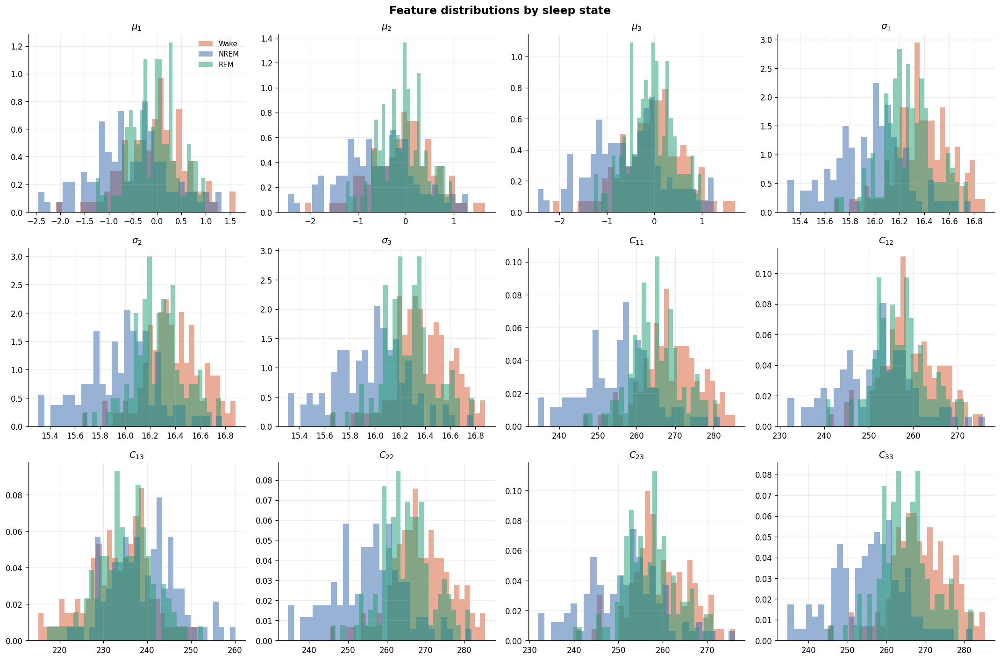

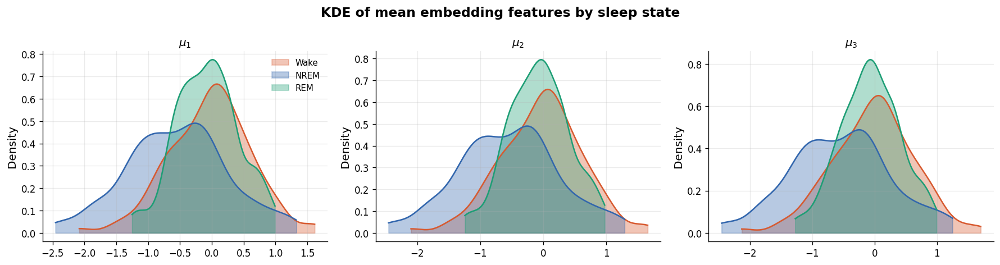

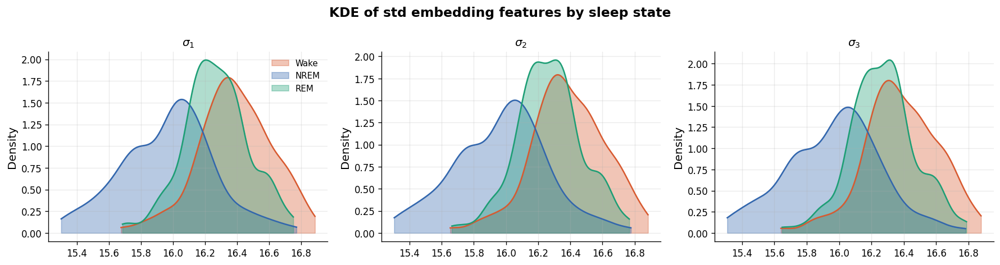

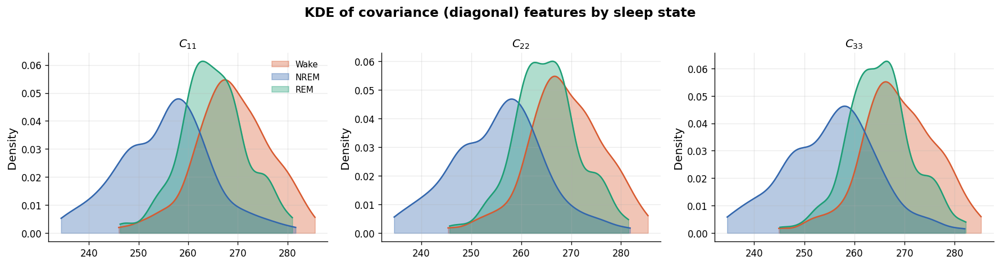

In [90]:

# ── Histograms of embedding features by sleep state ──
state_names = ['Wake', 'NREM', 'REM']
colors_list = ['#D85A30', '#3266ad', '#1D9E75']

feat_bal = embed_features_rich[idx_balanced]
lab_bal  = labels[idx_balanced]

feat_names = [
    r'$\mu_1$', r'$\mu_2$', r'$\mu_3$',
    r'$\sigma_1$', r'$\sigma_2$', r'$\sigma_3$',
    r'$C_{11}$', r'$C_{12}$', r'$C_{13}$',
    r'$C_{22}$', r'$C_{23}$', r'$C_{33}$',
]

fig, axes = plt.subplots(3, 4, figsize=(18, 12), sharey=False)
axes = axes.ravel()

for j in range(12):
    ax = axes[j]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        ax.hist(feat_bal[lab_bal == s, j], bins=30, alpha=0.5,
                color=color, label=name, density=True)
    ax.set_title(feat_names[j], fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if j == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('Feature distributions by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── KDE for mean features ──
from scipy.stats import gaussian_kde

mean_idx = [0, 1, 2]  # mu_1, mu_2, mu_3
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for k, j in enumerate(mean_idx):
    ax = axes[k]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        vals = feat_bal[lab_bal == s, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.35, color=color, label=name)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(feat_names[j], fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('KDE of mean embedding features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── KDE for std features ──
std_idx = [3, 4, 5]  # sigma_1, sigma_2, sigma_3
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for k, j in enumerate(std_idx):
    ax = axes[k]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        vals = feat_bal[lab_bal == s, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.35, color=color, label=name)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(feat_names[j], fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('KDE of std embedding features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── KDE for covariance diagonal features ──
cov_idx = [6, 9, 11]  # C_11, C_22, C_33
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for k, j in enumerate(cov_idx):
    ax = axes[k]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        vals = feat_bal[lab_bal == s, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.35, color=color, label=name)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(feat_names[j], fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('KDE of covariance (diagonal) features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


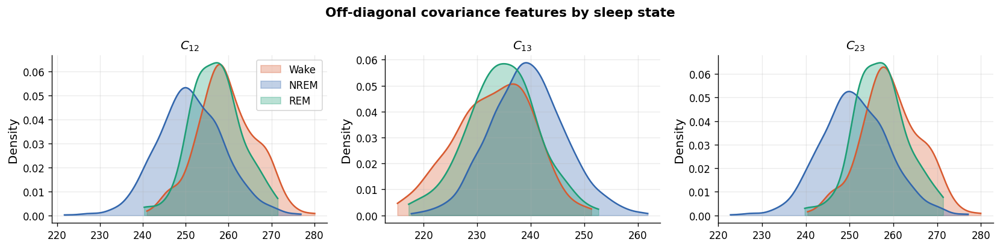

In [91]:
# Off-diagonal covariance features: C12, C13, C23
# These are indices 1, 2, 4 in the upper triangle (after mean and std)
# In embed_features_rich: [mu1,mu2,mu3, sd1,sd2,sd3, C11,C12,C13,C22,C23,C33]
#                          0    1   2    3   4   5    6   7   8   9   10  11

fig, axes = plt.subplots(1, 3, figsize=(14, 3.5))
offdiag_names = [r'$C_{12}$', r'$C_{13}$', r'$C_{23}$']
offdiag_idx = [7, 8, 10]

for ax, feat_idx, name in zip(axes, offdiag_idx, offdiag_names):
    for state, sname, color in zip([0,1,2], state_names, colors_list):
        mask = labels == state
        vals = embed_features_rich[mask, feat_idx]
        from scipy.stats import gaussian_kde
        kde = gaussian_kde(vals)
        x = np.linspace(vals.min(), vals.max(), 200)
        ax.fill_between(x, kde(x), alpha=0.3, color=color, label=sname)
        ax.plot(x, kde(x), color=color, lw=1.5)
    ax.set_title(name, fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if ax == axes[0]:
        ax.legend()

plt.suptitle('Off-diagonal covariance features by sleep state', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

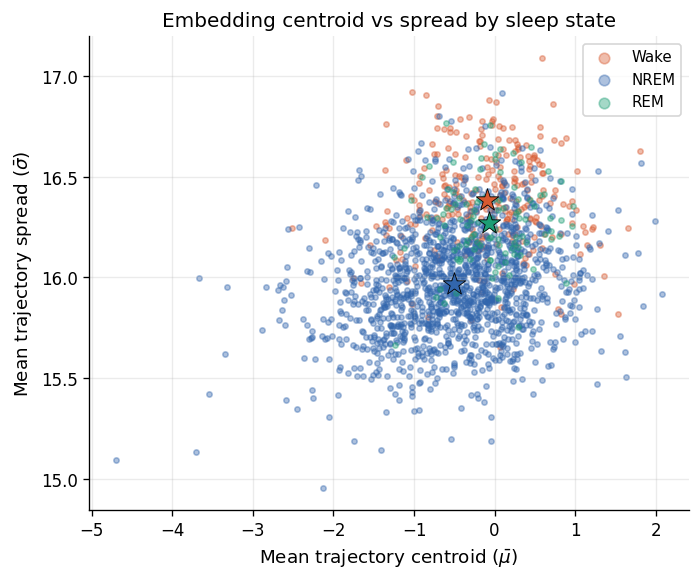

In [92]:
# Average across the 3 dimensions to get one mean and one std per window
mu_avg = embed_features_rich[:, 0:3].mean(axis=1)   # average centroid
sd_avg = embed_features_rich[:, 3:6].mean(axis=1)   # average spread

fig, ax = plt.subplots(figsize=(6, 5))
for state, name, color in zip([0,1,2], state_names, colors_list):
    mask = labels == state
    ax.scatter(mu_avg[mask], sd_avg[mask], c=color, label=name, s=10, alpha=0.4)

# Add class means as large markers
for state, name, color in zip([0,1,2], state_names, colors_list):
    mask = labels == state
    ax.scatter(mu_avg[mask].mean(), sd_avg[mask].mean(), 
               c=color, s=200, marker='*', edgecolors='black', linewidths=0.5, zorder=5)

ax.set_xlabel(r'Mean trajectory centroid ($\bar{\mu}$)', fontsize=11)
ax.set_ylabel(r'Mean trajectory spread ($\bar{\sigma}$)', fontsize=11)
ax.legend(fontsize=9, markerscale=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Embedding centroid vs spread by sleep state', fontsize=12)
plt.tight_layout()
plt.show()

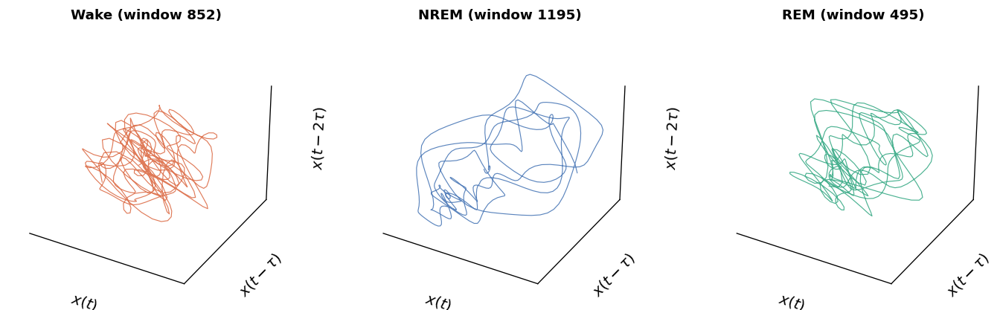

In [116]:
tau =8

# Use LDA projection to find the most "extreme" example of each state
lda_full = LinearDiscriminantAnalysis()
X_lda_full = lda_full.fit_transform(embed_features_rich, labels)

fig = plt.figure(figsize=(12, 4))

for i, (state, name, color) in enumerate(zip([0,1,2], state_names, colors_list)):
    mask = labels == state
    lda_vals = X_lda_full[mask]
    indices = np.where(mask)[0]
    
    # Find the window most confidently classified as this state
    # For each class, pick the point furthest from the other classes along LD1
    if state == 1:  # NREM is on the right of LD1
        best = indices[np.argmax(lda_vals[:, 0])]
    else:  # Wake and REM are on the left
        best = indices[np.argmin(lda_vals[:, 0]) if state == 0 else np.argmax(lda_vals[:, 1])]
    
    ax = fig.add_subplot(1, 3, i+1, projection='3d')
    X3 = embed(eeg_windows[best], dim, tau)
    ax.plot(X3[:,0][:500], X3[:,1][:500], X3[:,2][:500], lw=0.7, alpha=0.8, color=color)
    ax.set_title(f'{name} (window {best})', fontsize=11, fontweight='bold')
    ax.set_xlabel(r'$x(t)$')
    ax.set_ylabel(r'$x(t-\tau)$')
    ax.set_zlabel(r'$x(t-2\tau)$')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.grid(False)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('none')
    ax.yaxis.pane.set_edgecolor('none')
    ax.zaxis.pane.set_edgecolor('none')

fig.subplots_adjust(left=0.02, right=0.98, wspace=0.1)
plt.show()

Wake window 884: avg σ = 17.09
NREM window 1774: avg σ = 14.95
REM window 487: avg σ = 16.28


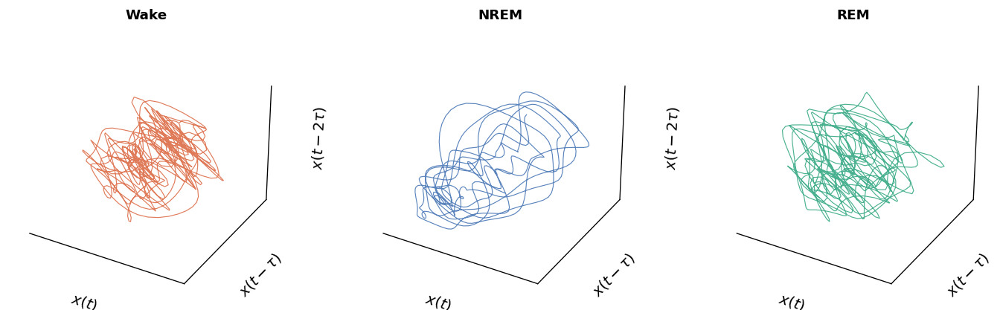

In [117]:
# Pick windows at the extremes of the std distribution (σ shows the most visual spread difference)
# Average std across 3 dims for each window
sd_avg = embed_features_rich[:, 3:6].mean(axis=1)

# Wake: pick the window with highest spread (right tail of Wake σ distribution)
wake_idx = np.where(labels == 0)[0]
best_wake = wake_idx[np.argmax(sd_avg[wake_idx])]

# NREM: pick the window with lowest spread (left tail of NREM σ distribution)  
nrem_idx = np.where(labels == 1)[0]
best_nrem = nrem_idx[np.argmin(sd_avg[nrem_idx])]

# REM: pick the window with median spread (middle of REM distribution)
rem_idx = np.where(labels == 2)[0]
median_pos = np.argsort(sd_avg[rem_idx])[len(rem_idx)//2]
best_rem = rem_idx[median_pos]

print(f"Wake window {best_wake}: avg σ = {sd_avg[best_wake]:.2f}")
print(f"NREM window {best_nrem}: avg σ = {sd_avg[best_nrem]:.2f}")
print(f"REM window {best_rem}: avg σ = {sd_avg[best_rem]:.2f}")

# Plot
fig = plt.figure(figsize=(12, 4))
for i, (idx, name, color) in enumerate([
    (best_wake, 'Wake', '#D85A30'),
    (best_nrem, 'NREM', '#3266ad'),
    (best_rem, 'REM', '#1D9E75')
]):
    ax = fig.add_subplot(1, 3, i+1, projection='3d')
    X3 = embed(eeg_windows[idx], dim, tau)
    ax.plot(X3[:,0], X3[:,1], X3[:,2], lw=0.7, alpha=0.8, color=color)
    ax.set_title(name, fontsize=11, fontweight='bold')
    ax.set_xlabel(r'$x(t)$')
    ax.set_ylabel(r'$x(t-\tau)$')
    ax.set_zlabel(r'$x(t-2\tau)$')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.grid(False)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('none')
    ax.yaxis.pane.set_edgecolor('none')
    ax.zaxis.pane.set_edgecolor('none')

fig.subplots_adjust(left=0.02, right=0.98, wspace=0.1)
plt.show()